In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import OPTICS
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import BisectingKMeans
from sklearn.cluster import SpectralClustering
from sklearn.mixture import GaussianMixture
import seaborn as sns
from yellowbrick.cluster import KElbowVisualizer
from kneed import KneeLocator
import plotly.graph_objects as go
from plotly.subplots import make_subplots
sns.set()
from mpl_toolkits.mplot3d import Axes3D

In [2]:
data = pd.read_csv("data.csv")
data.head()

,name,artist,track_URI,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,playlist
0,...Ready For It?,Taylor Swift,spotify:track:7zgqtptZvhf8GEmdsM2vp2,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,The Longest Playlist on Spotify® (Official)
1,Life Changes,Thomas Rhett,spotify:track:4Vxu50qVrQcycjRyJQaZLC,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,The Longest Playlist on Spotify® (Official)
2,24K Magic,Bruno Mars,spotify:track:6b8Be6ljOzmkOmFslEb23P,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,The Longest Playlist on Spotify® (Official)
3,Galway Girl,Ed Sheeran,spotify:track:0afhq8XCExXpqazXczTSve,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,The Longest Playlist on Spotify® (Official)
4,Photograph,Ed Sheeran,spotify:track:1HNkqx9Ahdgi1Ixy2xkKkL,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,The Longest Playlist on Spotify® (Official)


In [3]:
data.shape

(12138, 13)

In [4]:
data.isna().sum()

name                2
artist              2
track_URI           0
acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
playlist            0
dtype: int64

In [5]:
for i in data['track_URI'].value_counts():
    if i!=1:
        print(i)

In [6]:
data['artist'].value_counts()

Taylor Swift         155
Lacuna Coil           73
Charlie Brown         70
The Neighbourhood     65
Flyleaf               54
                    ... 
Phantogram             1
Eric Amarillo          1
James Hersey           1
Dawa                   1
girl in red            1
Name: artist, Length: 4111, dtype: int64

In [7]:
data.describe()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,12138.000000,12138.000000,12138.000000,12138.000000,12138.000000,12138.000000,12138.000000,12138.000000,12138.000000
mean,0.249016,0.567235,0.645816,0.105665,0.186278,-7.794664,0.068722,120.496019,0.461992
std,0.299363,0.163812,0.232343,0.254477,0.155873,4.419630,0.072007,28.049141,0.246406
min,0.000000,0.000000,0.000000,0.000000,0.000000,-53.436000,0.000000,0.000000,0.000000
25%,0.014100,0.465000,0.489000,0.000000,0.095000,-9.347750,0.034100,99.979000,0.264000
50%,0.101000,0.579000,0.691000,0.000046,0.122000,-6.631000,0.044200,119.998500,0.451000
75%,0.419000,0.686000,0.832000,0.011400,0.227000,-4.921000,0.069700,137.911750,0.655000
max,0.995000,0.980000,1.000000,0.999000,0.988000,-0.276000,0.957000,240.107000,0.990000


C:\Users\prana\AppData\Local\Temp\ipykernel_21440\1333459145.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), cmap = "coolwarm")


<AxesSubplot: >

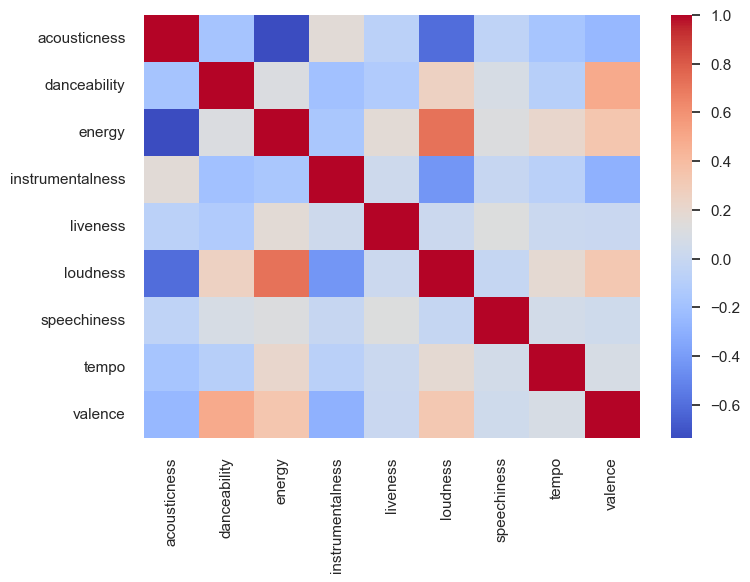

In [8]:
sns.heatmap(data.corr(), cmap = "coolwarm")

- The above heat map shows how strongly different numerical data correlates. The deep red shows strong positive relationships and the deep blue shows strong negative relationships. Some interesting correlations deserve a few comments.

- In another unsurprising trend, loudness correlates with energy. Intuitively, high energy songs radiate intensity, which often comes with loudness.

- Acousticness shares a few interesting negative relationships. Its inverse relationship with energy and loudness captures the idea of how most people image ballads.


## Principal Component Analysis (PCA)

In [3]:
df = data.copy()
non_features = ['name', 'artist', 'track_URI', 'playlist']
track_info = df[non_features]
df_X = df.drop(columns=non_features)
df_X.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201


In [4]:
scaler = StandardScaler()
X_std = scaler.fit_transform(df_X)

In [5]:
pca = PCA()
pca.fit(X_std);

In [6]:
# The attribute shows how much variance is explained by each of the nine features
evr = pca.explained_variance_ratio_
evr

array([0.3215915 , 0.15447604, 0.12258147, 0.10627117, 0.09758425,
       0.08784394, 0.05322885, 0.03783722, 0.01858558])

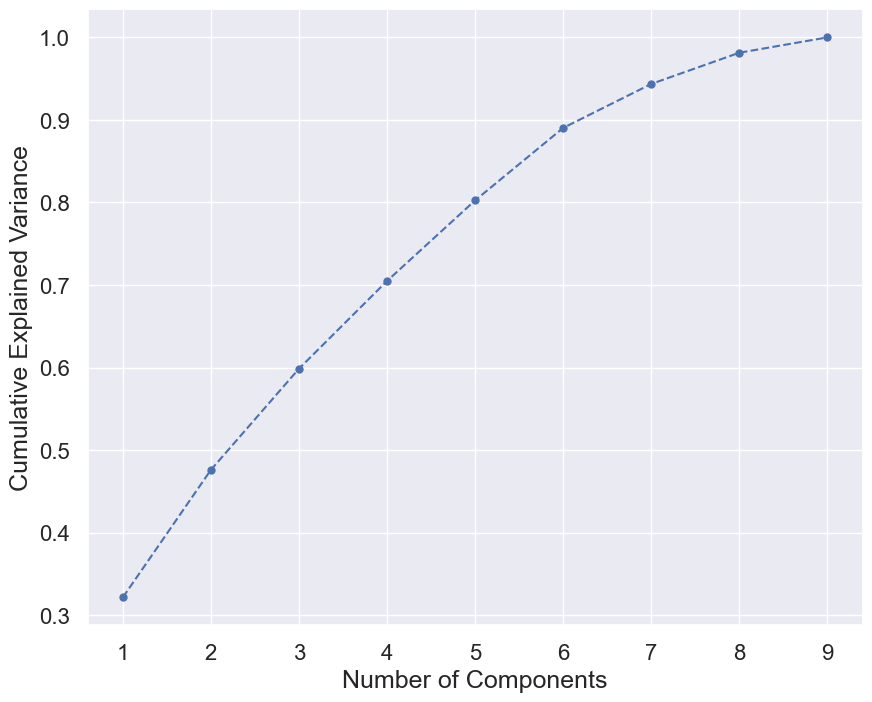

In [7]:
fig = plt.figure(figsize=(10,8))
plt.plot(range(1, len(df_X.columns)+1), evr.cumsum(), marker='o', linestyle='--')
plt.xlabel('Number of Components', fontsize=18)
plt.ylabel('Cumulative Explained Variance',fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
fig = plt.savefig("./visualizations/cumulative_variance_optics_plot.png")
plt.show()

In [8]:
for i, exp_var in enumerate(evr.cumsum()):
    if exp_var >= 0.8:
        n_comps = i + 1
        break
print("Number of components:", n_comps)
pca = PCA(n_components=n_comps)
pca.fit(X_std)
scores_pca = pca.transform(X_std)

Number of components: 5


## OPTICS Clustering

In [9]:
optics_pca = OPTICS(min_samples=10, max_eps=1)
optics_pca.fit(scores_pca);

In [10]:
set(optics_pca.labels_)

{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10}

## Analysis and Visualization

In [11]:
df_seg_pca_optics = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_seg_pca_optics.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_seg_pca_optics['Cluster'] = optics_pca.labels_
df_seg_pca_optics.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,-1
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,-1
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,-1
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,-1
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,-1


In [12]:
from sklearn.metrics import silhouette_score
silhouette_score(scores_pca, optics_pca.labels_)

-0.4941836290919559

C:\Users\prana\AppData\Local\Temp\ipykernel_31764\1926700286.py:4: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(df_seg_pca_optics,x = 'Component 2', y='Component 1', s=5,hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])


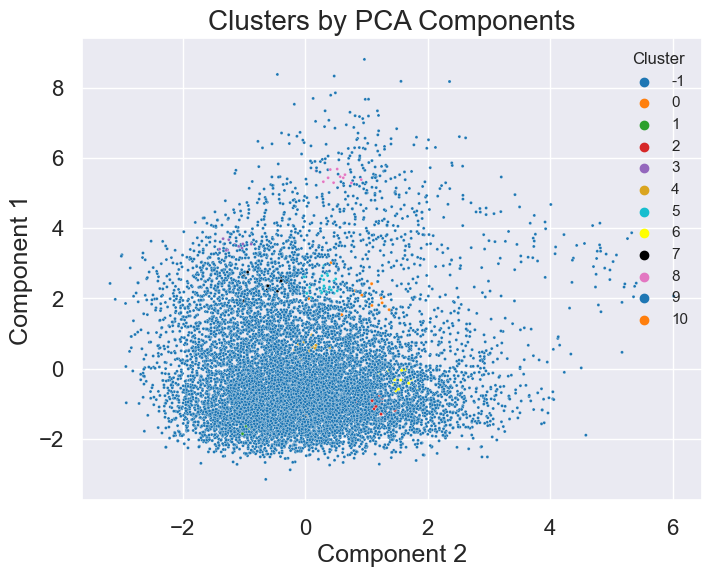

In [13]:
x = df_seg_pca_optics['Component 2']
y = df_seg_pca_optics['Component 1']
fig = plt.figure(figsize=(8, 6))
sns.scatterplot(df_seg_pca_optics,x = 'Component 2', y='Component 1', s=5,hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()
fig.savefig("./visualizations/clusters-2d-optics.png")

## DBSCAN

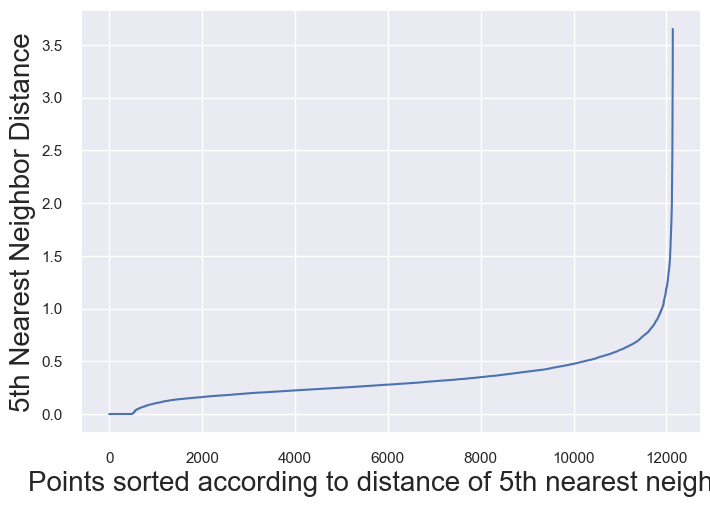

In [17]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=20)
nbrs = neigh.fit(scores_pca)
distances, indices = nbrs.kneighbors(scores_pca)
%matplotlib inline
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.xlabel('Points sorted according to distance of 5th nearest neighbor', fontsize=20)
plt.ylabel('5th Nearest Neighbor Distance', fontsize=20)
plt.savefig("visualizations/distanceplot_dbscan.png")
plt.show()

In [41]:
dbscan_pca = DBSCAN(eps=0.75,min_samples=15)
dbscan_pca.fit(scores_pca);

In [19]:
set(dbscan_pca.labels_)

{-1, 0, 1, 2, 3}

In [42]:
silhouette_score(scores_pca, dbscan_pca.labels_)

0.2758998480846971

In [43]:
df_seg_pca_db = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_seg_pca_db.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_seg_pca_db['Cluster'] = dbscan_pca.labels_
df_seg_pca_db.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,0
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,0
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,0
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,0
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,0


In [45]:
df_seg_pca_db['Cluster'].value_counts()

 0    9966
-1    2002
 1     143
 2      27
Name: Cluster, dtype: int64

C:\Users\prana\AppData\Local\Temp\ipykernel_31764\2325980422.py:2: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(df_seg_pca_db,x = 'Component 2', y='Component 1',s=7, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])


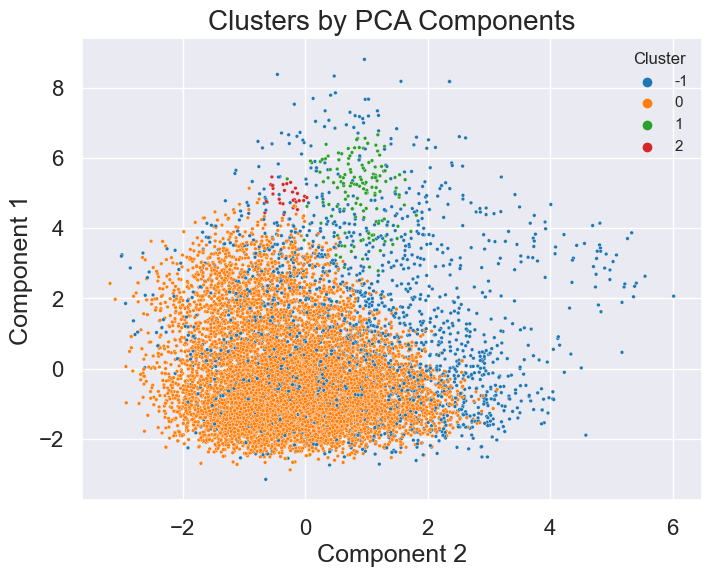

In [44]:
fig = plt.figure(figsize=(8, 6))
sns.scatterplot(df_seg_pca_db,x = 'Component 2', y='Component 1',s=7, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('visualizations/clusters_dbscan.png')
plt.show()

In [46]:
mean_pca = MeanShift()
mean_pca.fit(scores_pca);

In [77]:
set(mean_pca.labels_)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13}

In [47]:
silhouette_score(scores_pca, mean_pca.labels_)

0.3522134889960818

In [48]:
df_seg_pca_mean = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_seg_pca_mean.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_seg_pca_mean['Cluster'] = mean_pca.labels_
df_seg_pca_mean.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,0
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,0
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,0
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,0
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,0


In [50]:
df_seg_pca_mean['Cluster'].value_counts()

0     11606
11      133
8        99
5        80
4        65
9        61
6        31
3        22
14       16
1         9
2         7
7         5
13        2
12        1
10        1
Name: Cluster, dtype: int64

C:\Users\prana\AppData\Local\Temp\ipykernel_31764\2751650588.py:4: UserWarning: 
The palette list has fewer values (10) than needed (15) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(df_seg_pca_mean,x = 'Component 2', y='Component 1',s=5, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])


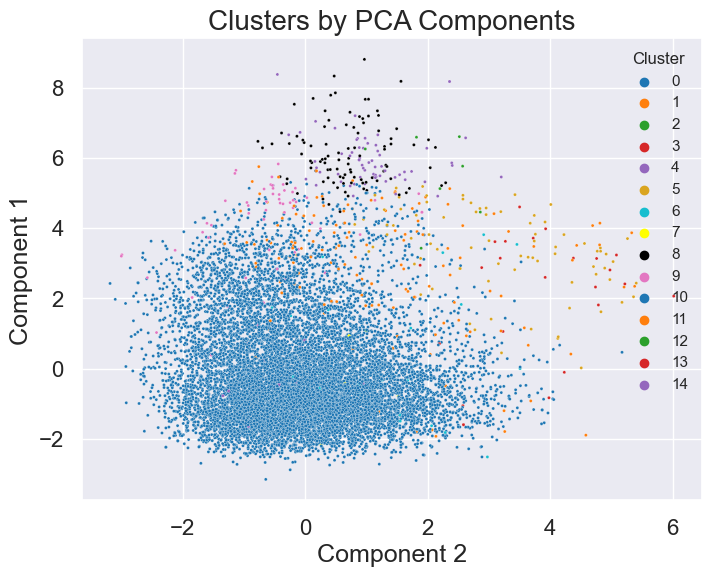

In [52]:
x = df_seg_pca_mean['Component 2']
y = df_seg_pca_mean['Component 1']
fig = plt.figure(figsize=(8, 6))
sns.scatterplot(df_seg_pca_mean,x = 'Component 2', y='Component 1',s=5, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig("visualizations/meanshift-cluster.png")
plt.show()


In [71]:
agg = AgglomerativeClustering(n_clusters=5,linkage="ward")
agg.fit(scores_pca);

In [79]:
set(agg.labels_)

{0, 1, 2, 3, 4}

In [74]:
silhouette_score(scores_pca, agg.labels_)

0.27196081741971534

In [72]:
df_seg_pca_agg = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_seg_pca_agg.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_seg_pca_agg['Cluster'] =agg.labels_
df_seg_pca_agg.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,0
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,0
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,0
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,0
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,1


C:\Users\prana\AppData\Local\Temp\ipykernel_31764\684279434.py:4: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  sns.scatterplot(df_seg_pca_agg,x = 'Component 2', y='Component 1',s=10, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])


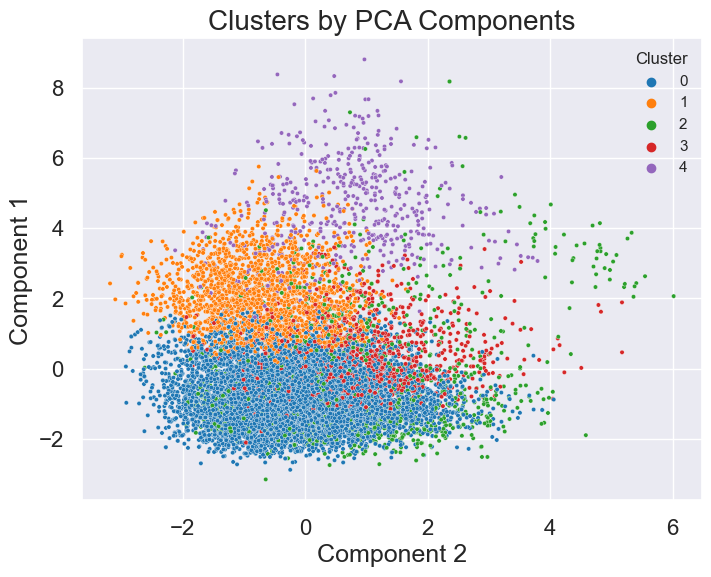

In [73]:
x = df_seg_pca_agg['Component 2']
y = df_seg_pca_agg['Component 1']
fig = plt.figure(figsize=(8, 6))
sns.scatterplot(df_seg_pca_agg,x = 'Component 2', y='Component 1',s=10, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('visualizations/cluster-2d-agg1.png')
plt.show()

In [105]:
bkmeans_pca = BisectingKMeans(n_clusters=10,init="k-means++")
bkmeans_pca.fit(scores_pca);

set(bkmeans_pca.labels_)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

In [106]:
silhouette_score(scores_pca, bkmeans_pca.labels_)

0.16069177183228336

In [93]:
df_seg_pca_bkm = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_seg_pca_bkm.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_seg_pca_bkm['Cluster'] =bkmeans_pca.labels_
df_seg_pca_bkm.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,5
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,0
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,0
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,0
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,7


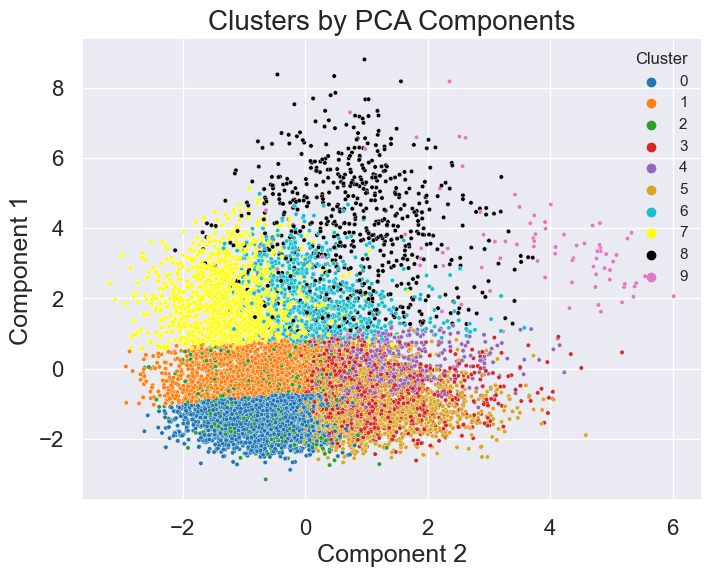

In [95]:
x = df_seg_pca_bkm['Component 2']
y = df_seg_pca_bkm['Component 1']
fig = plt.figure(figsize=(8, 6))
sns.scatterplot(df_seg_pca_bkm,x = 'Component 2', y='Component 1',s=10, hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig('visualizations/cluster-2d-bisect-kmeans.png')
plt.show()

In [135]:
for i in range(2,15):
    spectral_pca = SpectralClustering(n_clusters=i, random_state=30,assign_labels="discretize", n_neighbors=7, gamma=1.1)
    spectral_pca.fit(scores_pca);
    score = silhouette_score(scores_pca, spectral_pca.labels_)
    print(score, i)

0.6183501770983512 2
0.6168312429917372 3
0.5849658041697323 4
0.5802926219397919 5
0.4973253046993402 6
0.42060970410415605 7
0.41561110759560554 8
0.4158351133595727 9
0.41552001450275544 10
0.40730758787680027 11
0.40722886151748816 12
0.24509706595733277 13
0.2926138573071166 14


In [75]:
spectral_pca = SpectralClustering(n_clusters=2, random_state=30,assign_labels="discretize", n_neighbors=7, gamma=1.1)
spectral_pca.fit(scores_pca);
score = silhouette_score(scores_pca, spectral_pca.labels_)
print(score, 20)

0.6183501770983506 20


In [79]:
spectral_pca = SpectralClustering(n_clusters=10, random_state=30,assign_labels="discretize", n_neighbors=7, gamma=1.1)
spectral_pca.fit(scores_pca);

In [147]:
silhouette_score(scores_pca, spectral_pca.labels_)

0.41552001450275544

In [80]:
df_seg_pca_spectral = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_seg_pca_spectral.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_seg_pca_spectral['Cluster'] =spectral_pca.labels_
df_seg_pca_spectral.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,0
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,0
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,0
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,0
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,0


In [81]:
df_seg_pca_spectral['Cluster'].value_counts()

0    11508
8      545
5       47
9       14
6        7
3        5
1        3
7        3
2        3
4        3
Name: Cluster, dtype: int64

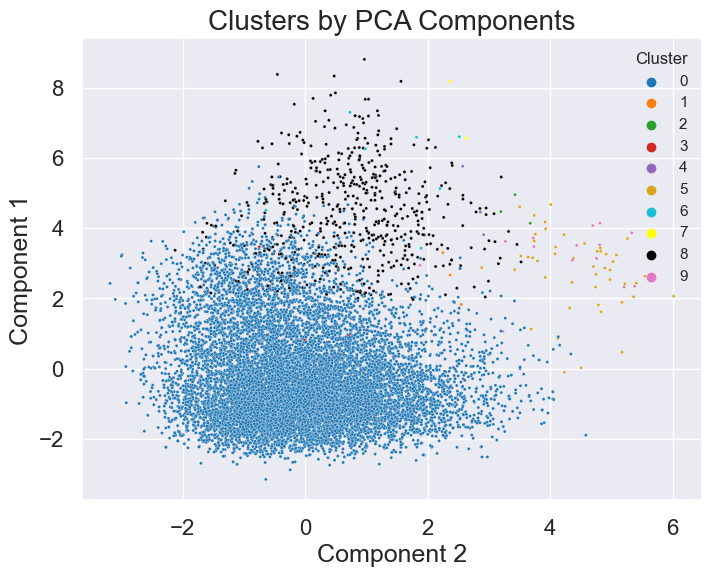

In [82]:
x = df_seg_pca_spectral['Component 2']
y = df_seg_pca_spectral['Component 1']
fig = plt.figure(figsize=(8, 6))
sns.scatterplot(df_seg_pca_spectral,x = 'Component 2',s=5, y='Component 1', hue='Cluster', palette = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'goldenrod', 'tab:cyan', 'yellow','black','tab:pink'])
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

In [127]:
def make_normalized_df(df):
    non_features = df[df.columns[9:]]
    features = df[df.columns[:9]]
    norm = MinMaxScaler().fit_transform(features)
    scaled = pd.DataFrame(norm, index=df.index, columns = df.columns[:9])
    return pd.concat([non_features, scaled], axis=1)

cluster_labels = df_seg_pca_spectral['Cluster']
# orig = df_seg_pca_spectral.drop(columns=['Cluster'])
values_df = make_normalized_df(df_seg_pca_spectral)
# values_df.insert(3, 'cluster', cluster_labels)
values_df.head()

,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,-1.169497,0.510848,0.199257,1.375003,0.322071,0,0.066834,0.627551,0.779,0.000000,0.156883,0.883785,0.141066,0.666370,0.457576
1,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,0,0.100503,0.701020,0.845,0.000000,0.045749,0.922987,0.060188,0.366387,0.817172
2,-1.717857,-1.088344,0.372795,-0.505178,0.395110,0,0.034171,0.834694,0.803,0.000000,0.154858,0.924643,0.083281,0.445510,0.638384
3,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,0,0.073869,0.636735,0.876,0.000000,0.330972,0.941723,0.104493,0.416244,0.788889
4,1.729481,-0.920606,-0.342867,0.188396,-0.413951,0,0.610050,0.626531,0.379,0.000464,0.099798,0.808051,0.049739,0.449754,0.203030


In [133]:
fig = make_subplots(rows=3, cols=4, specs=[[{'type': 'polar'}]*4]*3)

angles = list(values_df.columns[6:])
angles.append(angles[0])

'''
A - Acousticness
D - Danceability
E - Energy
I - Instrumentalness
Li - Liveness
Lo - Loudness
S - Speechiness
T - Tempo
V - Valence
'''
abbrev = ["A", "D", "E", "I", "Li", "Lo", "S", "T", "V"]

layoutdict = dict(
            radialaxis=dict(
            visible=True,
            range=[0, 1]
            ))

for i in range(10):
    subset = values_df[values_df['Cluster'] == i]
    data = [np.mean(subset[col]) for col in subset.columns[4:]]
    data.append(data[0])
    fig.add_trace(go.Scatterpolar(
        r=data,
        theta=abbrev,
        fill='toself',
        name="Cluster " + str(i)),
        i // 4 + 1,
        i % 4 + 1)
    
fig.update_layout(
        polar=layoutdict,
        polar2=layoutdict,
        polar3=layoutdict,
        polar4=layoutdict,
        polar5=layoutdict,
        polar6=layoutdict,
        polar7=layoutdict,
        polar8=layoutdict,
        showlegend=True
        )
fig.show()
#     fig.write_image('./visualizations/cluster' + str(i) + '.png')

In [84]:
min_bic = np.infty
results = {}
for k in range(1,41):
    for covariance_type in ("full","tied","spherical","diag"):
        print("("+str(k)+","+covariance_type+")",end=" ")
        bic = GaussianMixture(n_components=k, n_init=10,covariance_type=covariance_type, random_state=42).fit(scores_pca).bic(scores_pca)
        results[(k,covariance_type)] = bic
        if bic<min_bic:
            min_bic = bic
            best_k = k
            best_covariance_type = covariance_type
    print()

(1,full) (1,tied) (1,spherical) (1,diag) 
(2,full) (2,tied) (2,spherical) (2,diag) 
(3,full) (3,tied) (3,spherical) (3,diag) 
(4,full) (4,tied) (4,spherical) (4,diag) 
(5,full) (5,tied) (5,spherical) (5,diag) 
(6,full) (6,tied) (6,spherical) (6,diag) 
(7,full) (7,tied) (7,spherical) (7,diag) 
(8,full) (8,tied) (8,spherical) (8,diag) 
(9,full) (9,tied) (9,spherical) (9,diag) 
(10,full) (10,tied) (10,spherical) (10,diag) 
(11,full) (11,tied) (11,spherical) (11,diag) 
(12,full) (12,tied) (12,spherical) (12,diag) 
(13,full) (13,tied) (13,spherical) (13,diag) 
(14,full) (14,tied) (14,spherical) (14,diag) 
(15,full) (15,tied) (15,spherical) (15,diag) 
(16,full) (16,tied) (16,spherical) (16,diag) 
(17,full) (17,tied) (17,spherical) (17,diag) 
(18,full) (18,tied) (18,spherical) (18,diag) 
(19,full) (19,tied) (19,spherical) (19,diag) 
(20,full) (20,tied) (20,spherical) (20,diag) 
(21,full) (21,tied) (21,spherical) (21,diag) 
(22,full) (22,tied) (22,spherical) (22,diag) 
(23,full) (23,tied) (23,

In [85]:
best_k, best_covariance_type,min_bic

(19, 'full', 147025.043058468)

In [86]:
kvals = []
bicvals = []
for key in results:
    if key[1]=="full":
        kvals.append(key[0])
        bicvals.append(results[key])

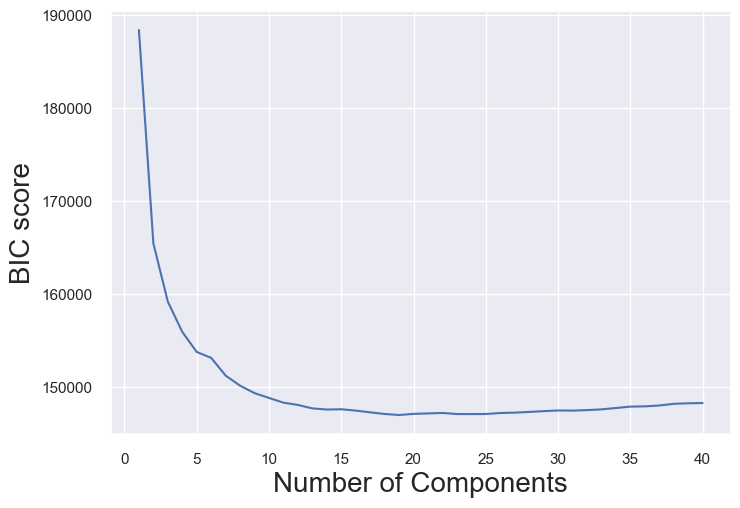

In [94]:
plt.tight_layout()
plt.plot(kvals,bicvals)
plt.xlabel("Number of Components",fontsize=20)
plt.ylabel("BIC score", fontsize=20)
plt.savefig("visualizations/bbic.png")

In [88]:
gmm = GaussianMixture(n_components=19,n_init=10,covariance_type="full")
gmm.fit(scores_pca);
labels = gmm.predict(scores_pca)

In [89]:
silhouette_score(scores_pca, labels)

0.05419119023423666

In [90]:
gmm.bic(scores_pca)

147114.5666123713

In [91]:
df_gmm = pd.concat([df_X.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_gmm.columns.values[(-1*n_comps):] = ["Component " + str(i+1) for i in range(n_comps)]
df_gmm['Cluster'] =labels
df_gmm.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Component 1,Component 2,Component 3,Component 4,Component 5,Cluster
0,0.0665,0.615,0.779,0.000000,0.1550,-6.454,0.1350,160.000,0.453,-1.169497,0.510848,0.199257,1.375003,0.322071,11
1,0.1000,0.687,0.845,0.000000,0.0452,-4.370,0.0576,87.972,0.809,-1.583398,-1.435919,-0.109021,-0.854235,0.478229,8
2,0.0340,0.818,0.803,0.000000,0.1530,-4.282,0.0797,106.970,0.632,-1.717857,-1.088344,0.372795,-0.505178,0.395110,13
3,0.0735,0.624,0.876,0.000000,0.3270,-3.374,0.1000,99.943,0.781,-1.869261,-0.140066,0.957690,-0.867016,-0.432026,14
4,0.6070,0.614,0.379,0.000464,0.0986,-10.480,0.0476,107.989,0.201,1.729481,-0.920606,-0.342867,0.188396,-0.413951,6


In [95]:
df_gmm['Cluster'].value_counts()

1     1416
8     1344
6     1224
13    1076
3     1016
12     790
14     771
18     749
2      620
9      540
11     526
5      377
16     349
0      333
4      293
15     222
7      194
10     189
17     109
Name: Cluster, dtype: int64

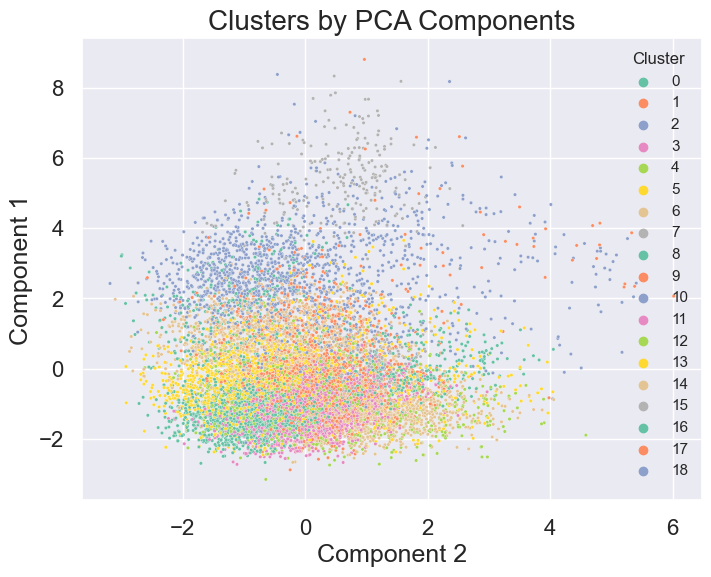

In [111]:
x = df_gmm['Component 2']
y = df_gmm['Component 1']
fig = plt.figure(figsize=(8, 6))
plt.tight_layout()
sns.scatterplot(df_gmm,x = 'Component 2', y='Component 1', s=6,hue='Cluster', palette = "Set2")
plt.title('Clusters by PCA Components', fontsize=20)
plt.xlabel("Component 2", fontsize=18)
plt.ylabel("Component 1", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.savefig("visualizations/gmm.png")
plt.show()

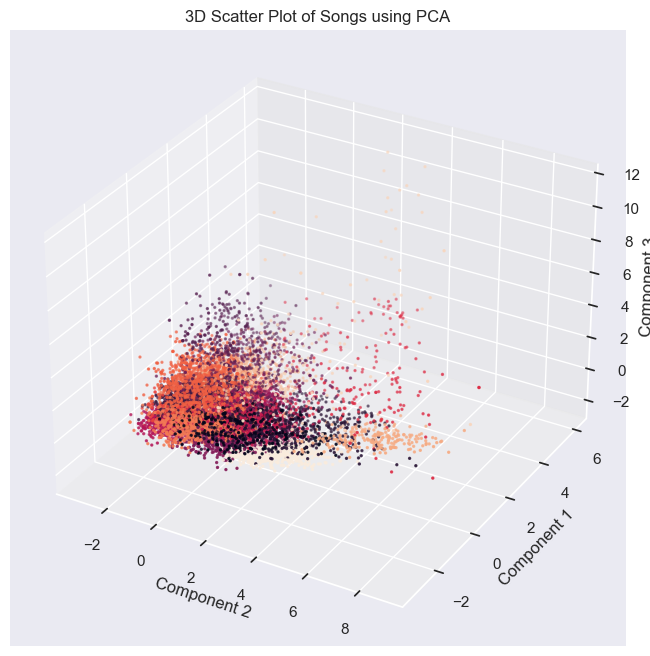

In [96]:
x = df_gmm['Component 1']
y = df_gmm['Component 2']
z = df_gmm['Component 3']
fig = plt.figure(figsize=(8,8))
plt.tight_layout()
ax = fig.add_subplot(111,projection='3d')
ax.scatter(x,y,z,s=2,c=df_gmm['Cluster'])
ax.set_xlabel("Component 2",fontsize=12)
ax.set_ylabel("Component 1",fontsize=12)
ax.set_zlabel("Component 3",fontsize=12)
ax.set_title("3D Scatter Plot of Songs using PCA")
plt.savefig("visualizations/3-d-pca-components.png")

In [102]:
df['Cluster'] = df_gmm['Cluster']

In [106]:
df.loc[df['Cluster'] == 10]

,name,artist,track_URI,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,playlist,Cluster
1996,How 'Bout You - Live,Eric Church,spotify:track:4tM1hVTKNFQ6EFXGhJyvIX,0.000085,0.428,0.968,0.775,0.971,-3.211,0.0634,120.666,0.428,The Longest Playlist on Spotify® (Official),10
2173,Sunset Beach,Charlie Brown,spotify:track:4eay3gVzYfPLHZ8sz9rmV2,0.919000,0.621,0.380,0.941,0.417,-10.942,0.0298,73.000,0.326,The Longest Playlist on Spotify® (Official),10
2233,Jonestown (Interlude),Post Malone,spotify:track:0R6Jlsq25eZB3Wftpxi3oF,0.755000,0.380,0.454,0.623,0.263,-10.271,0.0362,77.592,0.288,The Longest Playlist on Spotify® (Official),10
2381,Si Tu Veux,Mumford & Sons,spotify:track:0xoUKn55rmc6GTs7XVgpYI,0.614000,0.179,0.652,0.357,0.159,-5.719,0.0541,75.422,0.100,The Longest Playlist on Spotify® (Official),10
3746,Baba O'Riley,The Who,spotify:track:5l3iCMN9GLxofclApZXcmR,0.344000,0.409,0.691,0.409,0.229,-9.538,0.0377,116.965,0.156,The Longest Playlist on Spotify® (Official),10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11150,Medicine,Daughter,spotify:track:4TxJQDtvYHJcOBH6ONi6q2,0.106000,0.166,0.298,0.206,0.572,-12.439,0.0320,78.437,0.207,Sad songs to cry your heart out to 😭💔,10
11311,The Night We Met,Lord Huron,spotify:track:3hRV0jL3vUpRrcy398teAU,0.969000,0.544,0.369,0.279,0.639,-9.514,0.0380,87.010,0.102,Songs that WILL put you to sleep,10
11460,insomnia,glowstone,spotify:track:5bxrdLqPh1dyT4jIWlDyei,0.750000,0.479,0.154,0.920,0.358,-17.266,0.0356,104.455,0.505,Songs that WILL put you to sleep,10
11583,mas.,DJDStackz,spotify:track:2fRR41gmbCvJDCrOROHDu6,0.245000,0.443,0.182,0.754,0.223,-20.728,0.0451,81.256,0.142,Songs that WILL put you to sleep,10


In [107]:
def make_normalized_df(df, col_sep):
    non_features = df[df.columns[:col_sep]]
    features = df[df.columns[col_sep:]]
    norm = MinMaxScaler().fit_transform(features)
    scaled = pd.DataFrame(norm, index=df.index, columns = df.columns[col_sep:])
    return pd.concat([non_features, scaled], axis=1)

cluster_labels = df['Cluster']
orig = df.drop(columns=['playlist', 'Cluster'])
values_df = make_normalized_df(orig, 3)
values_df.insert(3, 'cluster', cluster_labels)
values_df.head()

,name,artist,track_URI,cluster,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,...Ready For It?,Taylor Swift,spotify:track:7zgqtptZvhf8GEmdsM2vp2,11,0.066834,0.627551,0.779,0.000000,0.156883,0.883785,0.141066,0.666370,0.457576
1,Life Changes,Thomas Rhett,spotify:track:4Vxu50qVrQcycjRyJQaZLC,8,0.100503,0.701020,0.845,0.000000,0.045749,0.922987,0.060188,0.366387,0.817172
2,24K Magic,Bruno Mars,spotify:track:6b8Be6ljOzmkOmFslEb23P,13,0.034171,0.834694,0.803,0.000000,0.154858,0.924643,0.083281,0.445510,0.638384
3,Galway Girl,Ed Sheeran,spotify:track:0afhq8XCExXpqazXczTSve,14,0.073869,0.636735,0.876,0.000000,0.330972,0.941723,0.104493,0.416244,0.788889
4,Photograph,Ed Sheeran,spotify:track:1HNkqx9Ahdgi1Ixy2xkKkL,6,0.610050,0.626531,0.379,0.000464,0.099798,0.808051,0.049739,0.449754,0.203030


In [109]:
fig = make_subplots(rows=5, cols=4, specs=[[{'type': 'polar'}]*4]*5)

angles = list(values_df.columns[4:])
angles.append(angles[0])

'''
A - Acousticness
D - Danceability
E - Energy
I - Instrumentalness
Li - Liveness
Lo - Loudness
S - Speechiness
T - Tempo
V - Valence
'''
abbrev = ["A", "D", "E", "I", "Li", "Lo", "S", "T", "V"]

layoutdict = dict(
            radialaxis=dict(
            visible=True,
            range=[0, 1]
            ))

for i in range(19):
    subset = values_df[values_df['cluster'] == i]
    data = [np.mean(subset[col]) for col in subset.columns[4:]]
    data.append(data[0])
    fig.add_trace(go.Scatterpolar(
        r=data,
        theta=abbrev,
        fill='toself',
        name="Cluster " + str(i)),
        i // 4 + 1,
        i % 4 + 1)
    
fig.update_layout(
        polar=layoutdict,
        polar2=layoutdict,
        polar3=layoutdict,
        polar4=layoutdict,
        polar5=layoutdict,
        polar6=layoutdict,
        polar7=layoutdict,
        polar8=layoutdict,
        showlegend=True
        )
fig.show()
#     fig.write_image('./visualizations/cluster' + str(i) + '.png')